### W51-E B6 central field imaging test

Aim: Compare gridders.

In [172]:
fieldname='W51-E'
band='B6'
uid='X215'

In [173]:
import os
from casatasks import tclean, immath, imregrid, split
from casatools import msmetadata, image
from casatools import table
tb = table()
msmd = ms = msmetadata()
ia = image()
import shutil

In [174]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy import wcs

In [175]:
import reproject

In [176]:
%matplotlib inline
import numpy as np
from astropy import units as u
import pylab as pl
pl.rcParams['figure.figsize'] = (16,8)
pl.style.use('dark_background')
pl.rcParams['image.origin'] = 'lower'
import sys
import glob
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/reduction/')
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis/')
import imp, diagnostic_images
imp.reload(diagnostic_images)
from diagnostic_images import load_images, show
from spectral_cube import SpectralCube
import spectral_cube

In [177]:
import warnings
import spectral_cube
warnings.simplefilter('ignore', spectral_cube.utils.BeamWarning)
warnings.simplefilter('ignore', spectral_cube.utils.StokesWarning)
warnings.simplefilter('ignore', spectral_cube.utils.PossiblySlowWarning)
warnings.simplefilter('ignore', spectral_cube.utils.WCSWarning)

In [178]:
import os
os.chdir("/orange/adamginsburg/ALMA_IMF/2017.1.01355.L")

In [30]:
origmsname = "/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_selfcal.ms"
msmd.open(origmsname)
antennae = ",".join([x for x in msmd.antennanames() if 'CM' not in x])
print(antennae)
msmd.close()

DA41,DA42,DA43,DA44,DA45,DA46,DA47,DA48,DA49,DA50,DA51,DA52,DA53,DA54,DA55,DA56,DA57,DA58,DA59,DA60,DA61,DA62,DA63,DA64,DV01,DV02,DV03,DV04,DV05,DV06,DV07,DV09,DV10,DV11,DV14,DV15,DV16,DV17,DV20,DV22,DV23,DV24,DV25,PM03,DA45,DA46,DA48,DA50,DA51,DA52,DA54,DA55,DA56,DA58,DA59,DA61,DA62,DA63,DA65,DV02,DV03,DV04,DV08,DV12,DV13,DV14,DV19,DV21,DV22,DV24,DV25


True

In [32]:
msname = origmsname.replace(".ms", "_no7m.ms")
split(vis=origmsname, outputvis=msname, antenna=antennae)

tb.open(msname+"/ANTENNA")
colnames = tb.colnames()
data = {cn: tb.getcol(cn) for cn in colnames}
tb.close()

mask7m = data['DISH_DIAMETER'] == 7
rownrs, = np.nonzero(mask7m)
print(rownrs)

tb.open(msname+"/ANTENNA", nomodify=False)
tb.removerows(rownrs)
tb.close()

True

In [33]:
msmd.open(msname)
print(msmd.nobservations())
for ii in range(msmd.nobservations()):
    print(f"{ii}: {msmd.antennaids(obsid=ii)}")
print(msmd.scannumbers(2), msmd.scannumbers(3), msmd.scannumbers(12))
print(msmd.fieldsforscans(msmd.scannumbers(obsid=2)))
print(msmd.fieldsforscans(msmd.scannumbers(obsid=3)))
print(msmd.fieldsforscans(msmd.scannumbers(obsid=12)))
fields_12m = msmd.fieldsforscans(msmd.scannumbers(obsid=12))
msmd.close()

13
0: []
1: []
2: [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54]
3: [11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54]
4: []
5: []
6: []
7: []
8: []
9: []
10: []
11: []
12: [11 12 13 14 19 23 30 34 35 39 40 41 43 44 46 47 48 49 51 56 57 58 59 60
 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82]
[67 68 70 72 74 75 78 79 81 83 85 86 89] [ 90  91  93  95  97  98 101 102 104 106 108 109 112] [297 298 300 302 304 305 308 309 311 313 315]
[11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37]
[11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37]
[11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34
 35 36 37]


True

[26, 27]


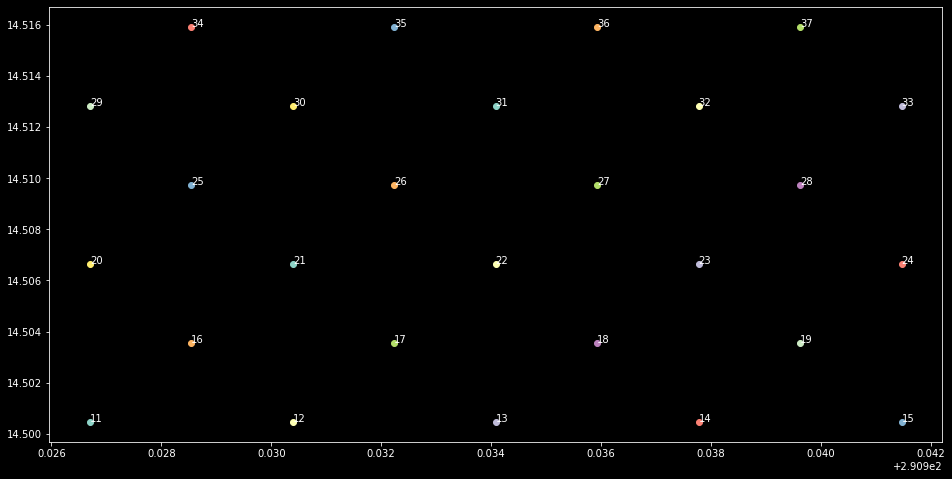

In [10]:
w51e2 = SkyCoord('19:23:43.939 +14:30:34.472', frame='fk5', unit=(u.hour, u.deg))
ax = pl.gca()
centerfield = []
msmd.open(msname)
for fid in msmd.fieldsforname('W51-E'):
    if fid in fields_12m:
        crd = msmd.phasecenter(fid)
        field_coord = SkyCoord(crd['m0']['value'], crd['m1']['value'],
                               frame=crd['refer'].lower(),
                               unit=(crd['m0']['unit'], crd['m1']['unit']))
        sep = w51e2.separation(field_coord)
        ax.scatter(field_coord.ra.deg, field_coord.dec.deg)
        ax.annotate(str(fid), (field_coord.ra.deg, field_coord.dec.deg))
        #print(f"{fid} is separated by {sep.to(u.arcsec):0.1f}")
        #print(f'circle({field_coord.ra.deg}, {field_coord.dec.deg}, 15")')
        if sep < 10*u.arcsec:
            centerfield.append(fid)
        
msmd.close()
print(centerfield)
centerfield=26

msmd.open(msname)
antennae = ",".join([x for x in msmd.antennanames() if 'CM' not in x])
print(antennae)
msmd.close()

In [181]:
releasepath = "/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/December2020Release/W51-E/B6/cleanest/"

In [182]:
finalitername = f"{releasepath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter"

In [183]:
finaliter = fits.open(f"{finalitername}.image.tt0.pbcor.fits")
ww = wcs.WCS(finaliter[0].header)
print(ww.celestial.pixel_scale_matrix*3600)

[[-0.06  0.  ]
 [ 0.    0.06]]


In [184]:
from astropy.visualization import simple_norm

In [185]:
def show(imagename_standard):
    img = SpectralCube.read(imagename_standard+".image", format='casa_image')    
    model = SpectralCube.read(imagename_standard+".model", format='casa_image')    
    residual = SpectralCube.read(imagename_standard+".residual", format='casa_image')    
    pb = SpectralCube.read(imagename_standard+".pb", format='casa_image')    


    pl.figure(figsize=(12,4))

    ax = pl.subplot(1,3,1)
    im = ax.imshow(img[0].value)
    pl.colorbar(mappable=im)
    ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
    ax = pl.subplot(1,3,2)
    im = ax.imshow(residual[0].value)
    pl.colorbar(mappable=im)
    ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)

    ax = pl.subplot(1,3,3)
    im = ax.imshow(model[0].value, norm=simple_norm(model[0].value, max_percent=99.995, min_percent=1, stretch='log'))
    #pl.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
    pl.colorbar(mappable=im)

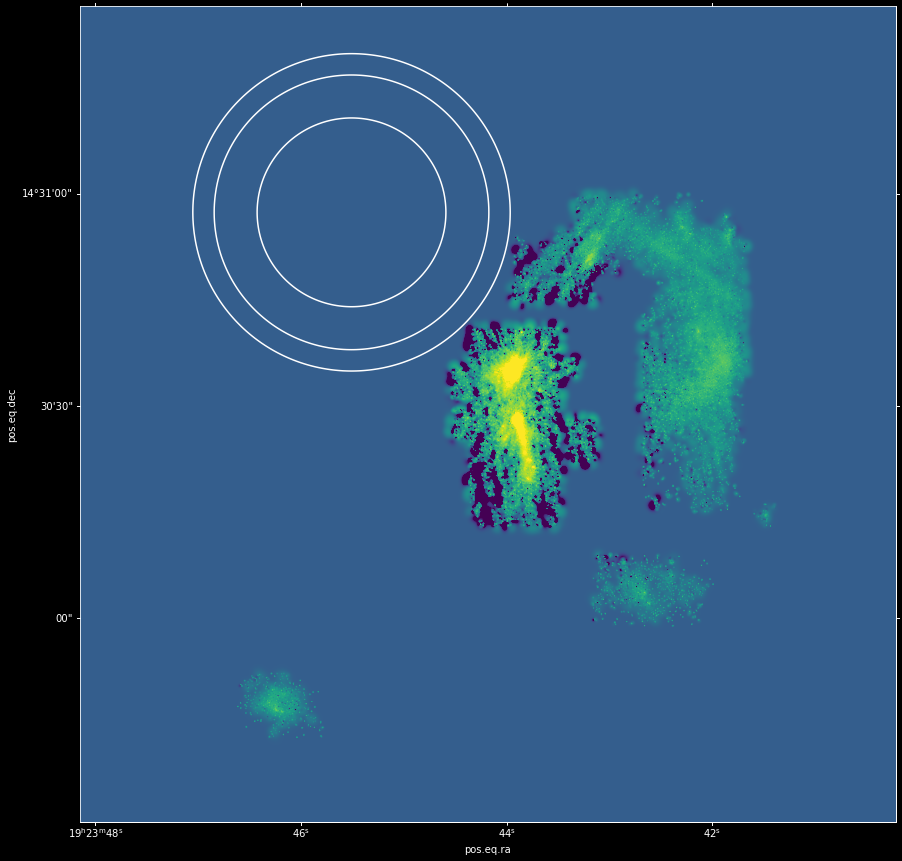

In [186]:
modimg = SpectralCube.read(f"{releasepath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0", format='casa_image')
fig = pl.figure(figsize=(15,15))
ax = fig.add_subplot(projection=modimg.wcs.celestial)
ax.imshow(modimg[0].value, norm=simple_norm(modimg, stretch='log', min_percent=1, max_percent=99.9))

pb = SpectralCube.read(f"{imagename_standard}.pb.tt0", format='casa_image')
ax.contour(pb[0].value, transform=ax.get_transform(pb.wcs.celestial), levels=[0.1,0.2,0.5], colors=['w']*3)

In [193]:
imrespath = 'imaging_results' # not reeally a release path...
finalmodelname = [f"{imrespath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0",
                  f"{imrespath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt1"]
finalpbname = f"{imrespath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.pb.tt0"
try:
    finalmodel_pbcor = immath(imagename=[finalmodelname[1], finalpbname], expr='IM0/IM1', outfile=finalmodelname[1]+".pbcor")
except Exception as ex:
    print(ex)
try:
    finalmodel_pbcor = immath(imagename=[finalmodelname[0], finalpbname], expr='IM0/IM1', outfile=finalmodelname[0]+".pbcor")
except Exception as ex:
    print(ex)

Output file imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt1.pbcor exists. immath can not proceed, please remove it or change the output file name.
Output file imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0.pbcor exists. immath can not proceed, please remove it or change the output file name.


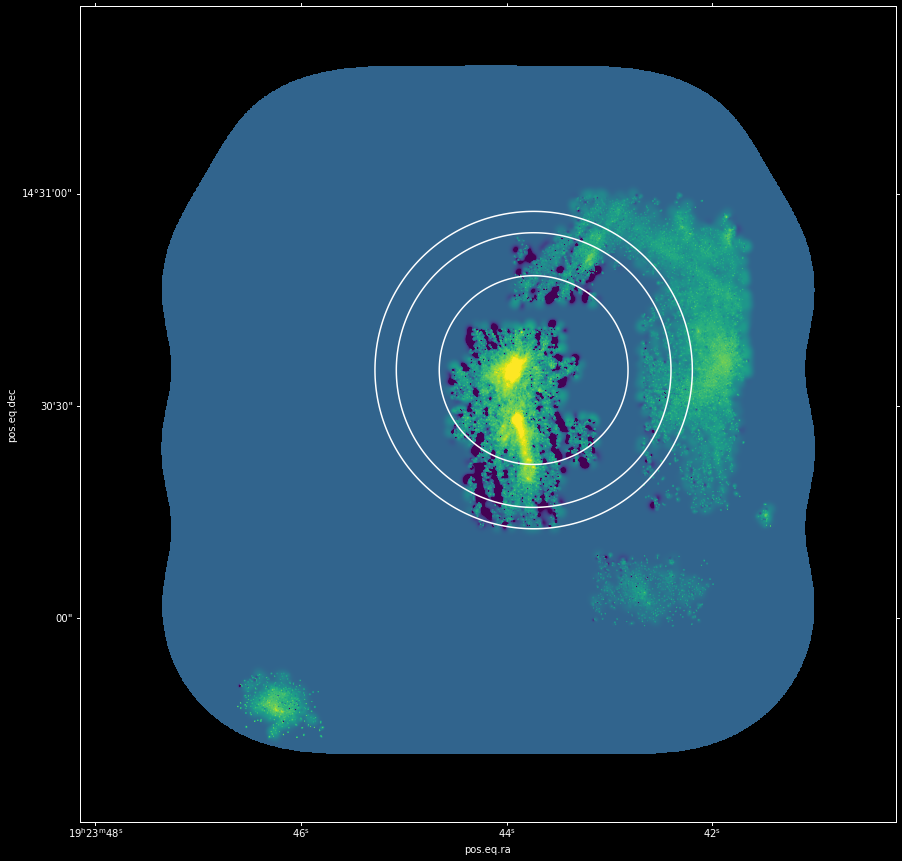

In [196]:
modimg = SpectralCube.read(f"imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0.pbcor", format='casa_image')
fig = pl.figure(figsize=(15,15))
ax = fig.add_subplot(projection=modimg.wcs.celestial)
ax.imshow(modimg[0].value, norm=simple_norm(modimg, stretch='log', min_percent=1, max_percent=99.9))

pb = SpectralCube.read(f"{imagename_standard}.pb.tt0", format='casa_image')
ax.contour(pb[0].value, transform=ax.get_transform(pb.wcs.celestial), levels=[0.1,0.2,0.5], colors=['w']*3)

mkdir imaging_results/W51-E_StandardGridderTests/

In [ ]:
#rm -r imaging_results/W51-E_StandardGridderTests/*

In [ ]:
#ls imaging_results/W51-E_StandardGridderTests/

In [197]:
stdgrdpath = "imaging_results/W51-E_StandardGridderTests/"

In [202]:
for field in fields_12m:
    imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"
    if os.path.exists(imagename_standard+".image.tt0"):
        if not os.path.exists(f"{imagename_standard}.dirty.image.tt0"):
            os.system(f"fr{imagename_standard}.*")
        else:
            continue
    tclean(vis=msname,
           selectdata=True,
           field=str(field),
           antenna=antennae,
           datacolumn="corrected",
           imagename=imagename_standard,
           imsize=[1000, 1000],
           #phasecenter="ICRS 290.9332327deg 14.50817819deg",
           cell=['0.06arcsec', '0.06arcsec'],
           stokes="I",projection="SIN",
           nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
           gridder="standard",
           deconvolver="mtmfs",
           pblimit=0.05,
           scales=[0, 3, 9],
           nterms=2,
           smallscalebias=0.6,
           restoration=True,
           pbcor=True,
           weighting="briggs",
           robust=0,
           niter=0,
           restart=True,
           savemodel="none",
           calcres=True,
           calcpsf=True,
           parallel=False)
    os.system(f"rm -r {imagename_standard}.model.*")
    os.system(f"rm -r {imagename_standard}.residual.*")
    # immath(imagename='', mode='evalexpr', outfile='immath_results.im', expr='IM0', varnames='', sigma='0.0mJy/beam', polithresh='', mask='', region='', box='', chans='', stokes='', stretch=False, imagemd='', prec='float')
    imregrid(imagename=finalmodelname[0]+".pbcor", template=imagename_standard+".image.tt0", output=imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor")
    imregrid(imagename=finalmodelname[1]+".pbcor", template=imagename_standard+".image.tt1", output=imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor")
    immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor", ],           
           expr="IM0 * IM1",
           outfile=imagename_standard+".model.tt0",
           imagemd=imagename_standard+".image.tt0")
    immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor", ],
           expr="IM0 * IM1",
           outfile=imagename_standard+".model.tt1",
           imagemd=imagename_standard+".image.tt1")
    for fn in [f"{imagename_standard}.image.tt{ii}" for ii in range(2)]:
        shutil.move(fn, fn.replace(".image", ".dirty.image"))

    tclean(vis=msname,
           selectdata=True,
           field=str(field),
           antenna=antennae,
           datacolumn="corrected",
           imagename=imagename_standard,
           imsize=[1000, 1000],
           #phasecenter="ICRS 290.9332327deg 14.50817819deg",
           cell=['0.06arcsec', '0.06arcsec'],
           stokes="I",projection="SIN",
           nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
           gridder="standard",
           deconvolver="mtmfs",
           scales=[0, 3, 9],
           nterms=2,
           pblimit=0.05,
           smallscalebias=0.6,
           restoration=True,
           pbcor=True,
           weighting="briggs",
           robust=0,
           niter=0,
           restart=True,
           savemodel="none",
           calcres=True,
           calcpsf=True,
           parallel=False)

In [ ]:
field=16

In [ ]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"

In [ ]:
#rm -r imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field*

In [ ]:
ls -d $imagename_standard*

In [ ]:
ls -d imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0

In [ ]:
ia.open('imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0')
print(f"Original model brightness unit: {ia.brightnessunit()}")
print(f"Original model pixel scale: {ia.coordsys().torecord()['direction0']}")
ia.close()
ia.open(imagename_standard+".model.tt0")
print(f"Convolved, regridded model brightness unit: {ia.brightnessunit()}")
print(f"Convolved, regridded model pixel scale: {ia.coordsys().torecord()['direction0']}")
ia.close()
ia.open(imagename_standard+".image.tt0")
print(f"Standard image brightness unit: {ia.brightnessunit()}")
print(f"Standard image pixel scale: {ia.coordsys().torecord()['direction0']}")
ia.close()

In [ ]:
fid = 16
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
img = SpectralCube.read(imagename_standard+".image.tt0", format='casa_image')    

pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')    

dirtyimg = SpectralCube.read(imagename_standard+".dirty.image.tt0", format='casa_image')

model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')
repmod = SpectralCube.read(f'imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}_finalmodel_proj_std.model.tt0.pbcor', format='casa_image')
origmod = SpectralCube.read('imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0', format='casa_image')

residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')
pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')

pl.figure(figsize=(20,5))
pl.subplot(1,5,1).imshow(img[0].value, norm=simple_norm(dirtyimg[0].value))
#pl.subplot(1,4,2).imshow(residual[0].value)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Image")
pl.subplot(1,5,2).imshow(dirtyimg[0].value, norm=simple_norm(dirtyimg[0].value))
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Dirty Image")

pl.subplot(1,5,3).imshow(model[0].value, vmax=0.005, vmin=-0.00001)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Mosaic model (multiplied by PB)")
pl.subplot(1,5,4).imshow(repmod[0].value, vmax=0.005, vmin=-0.00001)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Mosaic model")
pl.subplot(1,5,5).imshow(residual[0].value, norm=simple_norm(dirtyimg[0].value) )
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Residual")

#lims = pl.gca().axis()
#ax = pl.subplot(1,5,5, projection=img[0].wcs)
#ax.imshow(origmod[0].value, vmax=0.0001, vmin=-0.00001, transform=ax.get_transform(origmod.wcs.celestial))
#ax.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2, transform=ax.get_transform(pb.wcs.celestial))
#ax.axis(lims)

In [ ]:
fid = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
img = SpectralCube.read(imagename_standard+".image.tt0", format='casa_image')    

pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')    

dirtyimg = SpectralCube.read(imagename_standard+".dirty.image.tt0", format='casa_image')

model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')
repmod = SpectralCube.read(f'imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}_finalmodel_proj_std.model.tt0.pbcor', format='casa_image')
origmod = SpectralCube.read('imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt0', format='casa_image')

residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')
pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')

pl.figure(figsize=(20,5))
pl.subplot(1,5,1).imshow(img[0].value, norm=simple_norm(dirtyimg[0].value))
#pl.subplot(1,4,2).imshow(residual[0].value)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Image")
pl.subplot(1,5,2).imshow(dirtyimg[0].value, norm=simple_norm(dirtyimg[0].value))
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Dirty Image")

pl.subplot(1,5,3).imshow(model[0].value, vmax=0.005, vmin=-0.00001)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Mosaic model (multiplied by PB)")
pl.subplot(1,5,4).imshow(repmod[0].value, vmax=0.005, vmin=-0.00001)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Mosaic model")
pl.subplot(1,5,5).imshow(residual[0].value, norm=simple_norm(dirtyimg[0].value) )
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Residual")

#lims = pl.gca().axis()
#ax = pl.subplot(1,5,5, projection=img[0].wcs)
#ax.imshow(origmod[0].value, vmax=0.0001, vmin=-0.00001, transform=ax.get_transform(origmod.wcs.celestial))
#ax.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2, transform=ax.get_transform(pb.wcs.celestial))
#ax.axis(lims)

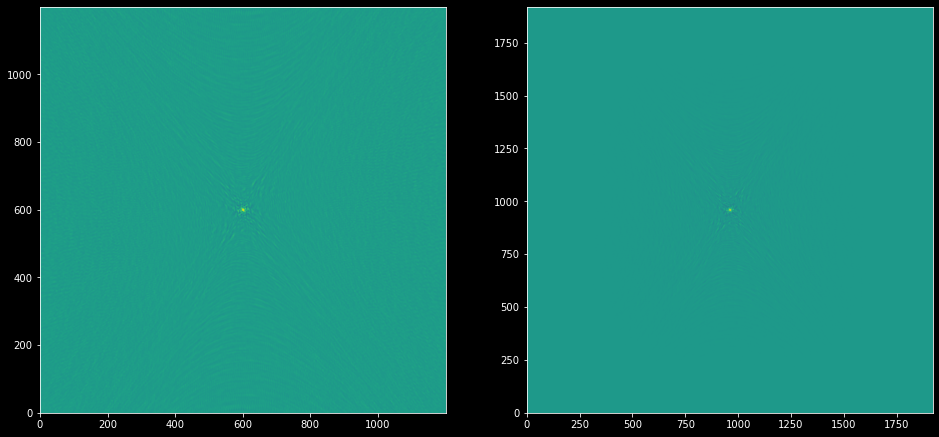

In [95]:
stdpsf = SpectralCube.read(imagename_standard+".psf.tt0", format='casa_image')    
mospsf = SpectralCube.read(f"{finalitername}.psf.tt0", format='casa_image')
pl.subplot(1,2,1).imshow(stdpsf[0].value, norm=simple_norm(stdpsf[0].value, stretch='log'))
pl.subplot(1,2,2).imshow(mospsf[0].value, norm=simple_norm(mospsf[0].value, stretch='log'))

(-0.5, 999.5, -0.5, 999.5)

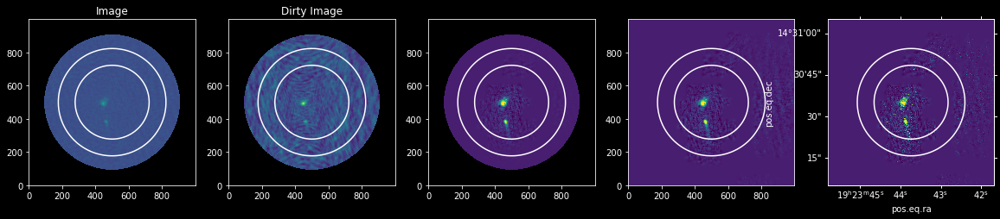

In [188]:
fid = 26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}"

img = SpectralCube.read(imagename_standard+".image.tt1.pbcor", format='casa_image')    
img = SpectralCube.read(imagename_standard+".image.tt1", format='casa_image')    

dirtyimg = SpectralCube.read(imagename_standard+".dirty.image.tt1", format='casa_image')

model = SpectralCube.read(imagename_standard+".model.tt1", format='casa_image')
repmod = SpectralCube.read(f'imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}_finalmodel_proj_std.model.tt1.pbcor', format='casa_image')
origmod = SpectralCube.read('imaging_results/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.model.tt1', format='casa_image')

residual = SpectralCube.read(imagename_standard+".residual.tt1", format='casa_image')
pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')

pl.figure(figsize=(20,5))
pl.subplot(1,5,1).imshow(img[0].value, norm=simple_norm(dirtyimg[0].value))
#pl.subplot(1,4,2).imshow(residual[0].value)
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Image")
pl.subplot(1,5,2).imshow(dirtyimg[0].value, norm=simple_norm(dirtyimg[0].value))
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.title("Dirty Image")

pl.subplot(1,5,3).imshow(model[0].value, norm=simple_norm(model[0].value, min_percent=1, max_percent=99.9))
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
pl.subplot(1,5,4).imshow(repmod[0].value, norm=simple_norm(model[0].value, min_percent=1, max_percent=99.9))
pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
lims = pl.gca().axis()
ax = pl.subplot(1,5,5, projection=img[0].wcs)
ax.imshow(origmod[0].value, norm=simple_norm(model[0].value, min_percent=1, max_percent=99.9), transform=ax.get_transform(origmod.wcs.celestial))
ax.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2, transform=ax.get_transform(pb.wcs.celestial))
ax.axis(lims)

In [189]:
finaliterim = SpectralCube.read(f"{releasepath}/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits")

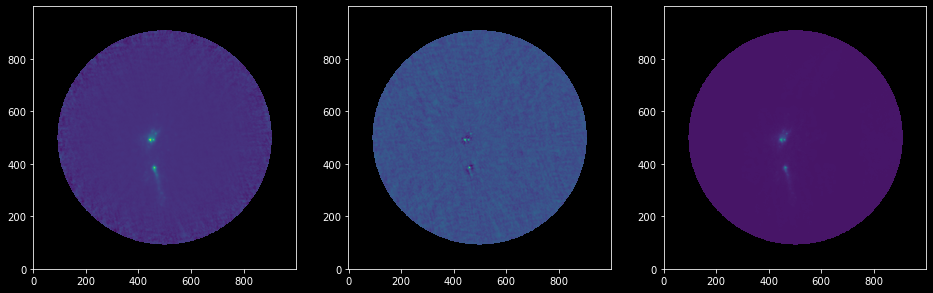

In [190]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{fid}"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    

pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

diff = {}
for field in fields_12m:
    imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"

    img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')

    reprj = finaliterim[0].reproject(img[0].header)
    diff[field] = (reprj.value-img[0].value)

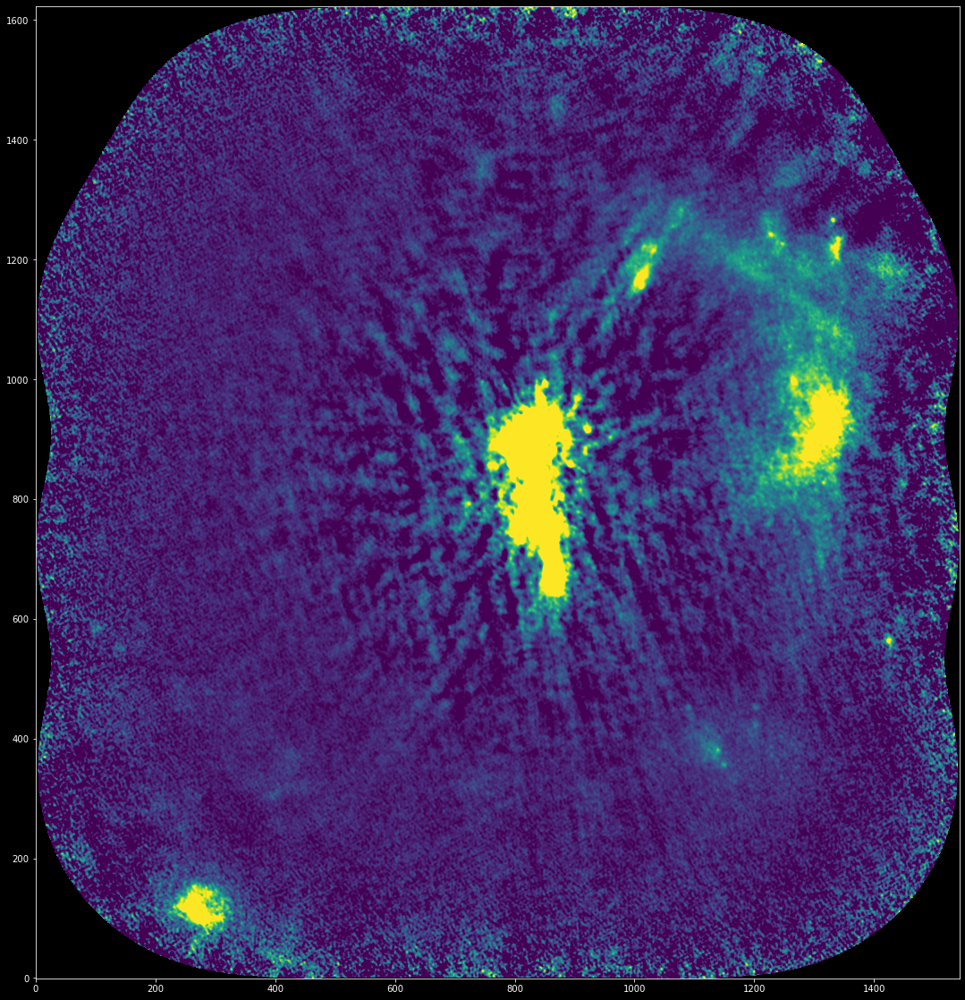

In [160]:
pl.figure(figsize=(20,20))
pl.imshow(finaliterim.minimal_subcube()[0].value, vmax=0.005, vmin=-0.0005)

/orange/adamginsburg/miniconda3/envs/casa61_py36/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


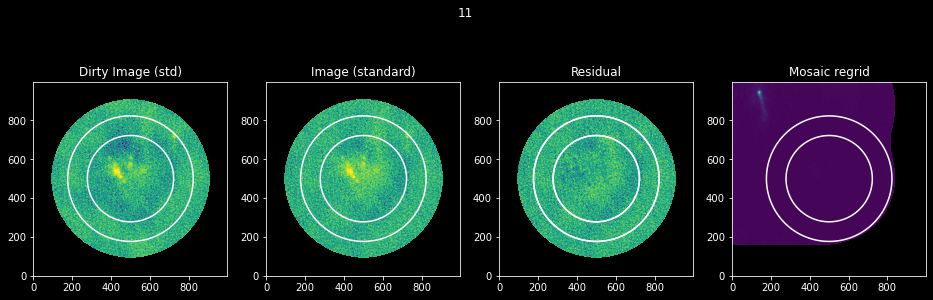

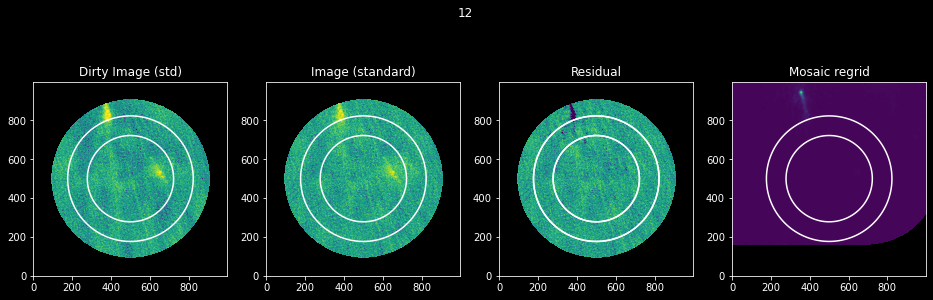

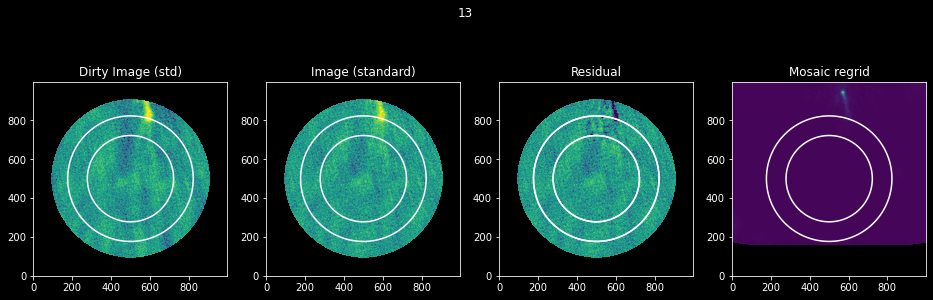

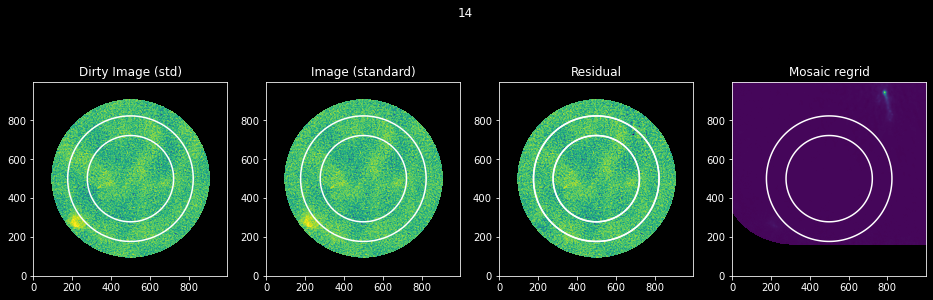

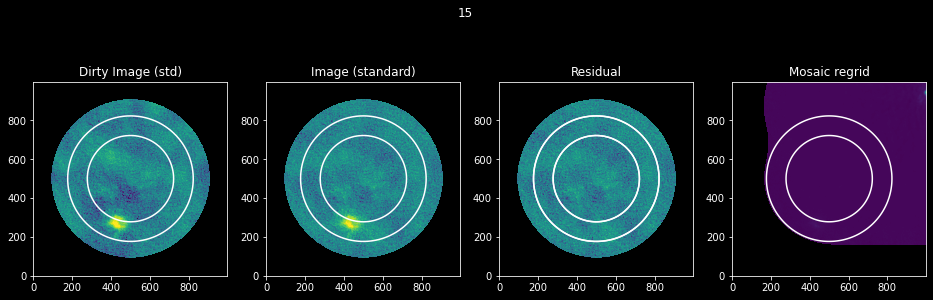

...

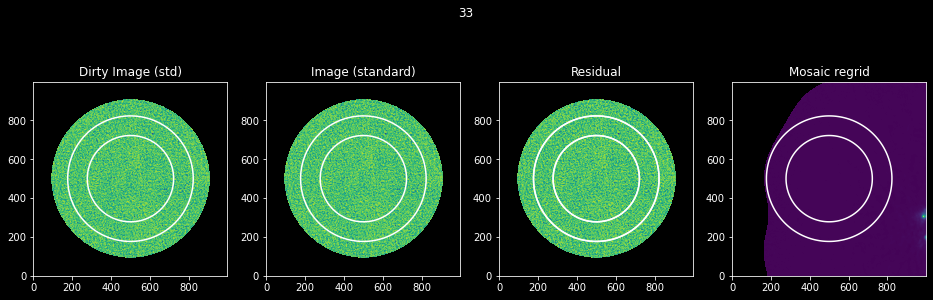

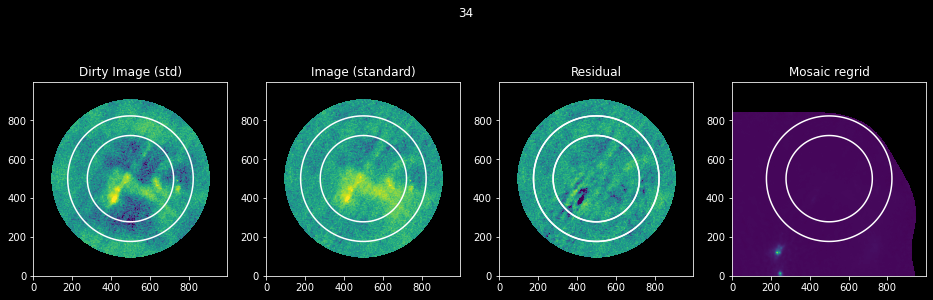

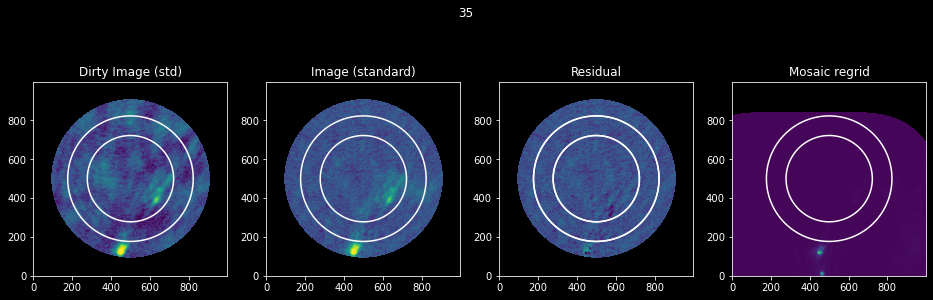

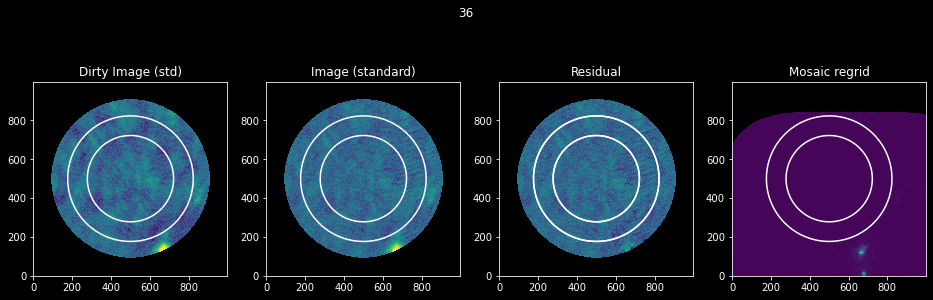

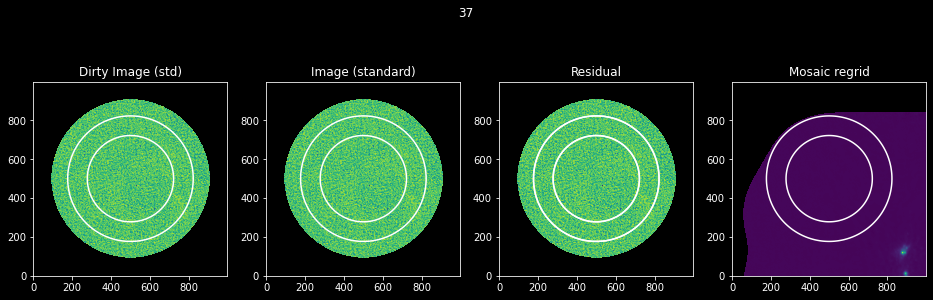

In [203]:
diff = {}

for field in fields_12m:
    pl.figure(figsize=(16,5))
    imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"

    img = SpectralCube.read(imagename_standard+".image.tt0", format='casa_image')
    dirtyimg = SpectralCube.read(imagename_standard+".dirty.image.tt0", format='casa_image')
    resid = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')
    reprj = finaliterim[0].reproject(img[0].header)
    diff[field] = (reprj.value-img[0].value)
    pb = SpectralCube.read(imagename_standard+".pb.tt0", format='casa_image')    

    
    pl.subplot(1,4,1).imshow(dirtyimg[0].value, norm=simple_norm(dirtyimg[0].value, min_percent=1, max_percent=99.9, stretch='asinh'))
    pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
    pl.title("Dirty Image (std)")
    pl.subplot(1,4,2).imshow(img[0].value, norm=simple_norm(dirtyimg[0].value, min_percent=1, max_percent=99.9, stretch='asinh'))
    pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
    pl.title("Image (standard)")
    pl.subplot(1,4,3).imshow(resid[0].value, norm=simple_norm(dirtyimg[0].value, min_percent=1, max_percent=99.9, stretch='asinh'))
    pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
    pl.title("Residual")
    reprj = finaliterim[0].reproject(img[0].header)
    pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
    pl.subplot(1,4,4).imshow(reprj.value)
    pl.title("Mosaic regrid")
    pl.contour(pb[0].value, levels=[0.2,0.5], colors=['w']*2)
    pl.suptitle(field)

In [171]:
# EXPERIMENT: don't multiply by pb

field=26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_nopbdegrade"
os.system(f"rm -r {imagename_standard}*")

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       spw="",
       timerange="",
       uvrange="",
       antenna=antennae,
       scan="",
       observation="",
       intent="",
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1000, 1000],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       verbose=False,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)
os.system(f"rm -r {imagename_standard}.model.*")
os.system(f"rm -r {imagename_standard}.residual.*")
# immath(imagename='', mode='evalexpr', outfile='immath_results.im', expr='IM0', varnames='', sigma='0.0mJy/beam', polithresh='', mask='', region='', box='', chans='', stokes='', stretch=False, imagemd='', prec='float')
imregrid(imagename=finalmodelname[0]+".pbcor", template=imagename_standard+".image.tt0", output=imagename_standard+".model.tt0", overwrite=True)
imregrid(imagename=finalmodelname[1]+".pbcor", template=imagename_standard+".image.tt0", output=imagename_standard+".model.tt1", overwrite=True)
#immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor", ],           
#       expr="IM0 * IM1",
#       outfile=imagename+".model.tt0",
#       imagemd=imagename_standard+".image.tt0")
#immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor", ],
#       expr="IM0 * IM1",
#       outfile=imagename+".model.tt1",
#       imagemd=imagename_standard+".image.tt1")



ia.open(f"{imagename_standard}.image.tt0")
csi=ia.coordsys()
print(csi.torecord()['spectral2'])
ia.close()

ia.open(f"{imagename_standard}.model.tt0")
csm=ia.coordsys()
print(csm.torecord()['spectral2'])
ia.setcoordsys(csi.torecord())
ia.close()

ia.open(f"{imagename_standard}.model.tt1")
csm=ia.coordsys()
print(csm.torecord()['spectral2'])
ia.setcoordsys(csi.torecord())
ia.close()

os.system(f"rm -r {imagename_standard}.image.*")


tclean(vis=msname,
       selectdata=True,
       field=str(field),
       spw="",
       timerange="",
       uvrange="",
       antenna=antennae,
       scan="",
       observation="",
       intent="",
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1000, 1000],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       verbose=False,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

{'conversion': {'direction': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 1.5707963267948966}, 'refer': 'J2000', 'type': 'direction'}, 'epoch': {'m0': {'unit': 'd', 'value': 0.0}, 'refer': 'LAST', 'type': 'epoch'}, 'position': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 0.0}, 'm2': {'unit': 'm', 'value': 0.0}, 'refer': 'ITRF', 'type': 'position'}, 'system': 'LSRK'}, 'formatUnit': '', 'name': 'Frequency', 'nativeType': 0, 'restfreq': 216200000000.0, 'restfreqs': array([2.162e+11]), 'system': 'LSRK', 'unit': 'Hz', 'velType': 0, 'velUnit': 'km/s', 'version': 2, 'waveUnit': 'mm', 'wcs': {'cdelt': 16995929772.803253, 'crpix': 0.0, 'crval': 224541136065.8075, 'ctype': 'FREQ', 'pc': 1.0}}
{'conversion': {'direction': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 1.5707963267948966}, 'refer': 'J2000', 'type': 'direction'}, 'epoch': {'m0': {'unit': 'd', 'value': 0.0}, 'refer': 'LAST', 'type': 'epoch'}, 'position': {'m0': {'

{}

In [109]:
# EXPERIMENT: don't divide original model by PB

field=26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_nopbcor"
os.system(f"rm -r {imagename_standard}*")

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       spw="",
       timerange="",
       uvrange="",
       antenna=antennae,
       scan="",
       observation="",
       intent="",
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1000, 1000],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       verbose=False,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)
os.system(f"rm -r {imagename_standard}.model.*")
os.system(f"rm -r {imagename_standard}.residual.*")
# immath(imagename='', mode='evalexpr', outfile='immath_results.im', expr='IM0', varnames='', sigma='0.0mJy/beam', polithresh='', mask='', region='', box='', chans='', stokes='', stretch=False, imagemd='', prec='float')
imregrid(imagename=finalmodelname[0], template=imagename_standard+".image.tt0", output=imagename_standard+".model.tt0", overwrite=True)
imregrid(imagename=finalmodelname[1], template=imagename_standard+".image.tt0", output=imagename_standard+".model.tt1", overwrite=True)
#immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor", ],           
#       expr="IM0 * IM1",
#       outfile=imagename+".model.tt0",
#       imagemd=imagename_standard+".image.tt0")
#immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor", ],
#       expr="IM0 * IM1",
#       outfile=imagename+".model.tt1",
#       imagemd=imagename_standard+".image.tt1")



ia.open(f"{imagename_standard}.image.tt0")
csi=ia.coordsys()
print(csi.torecord()['spectral2'])
ia.close()

ia.open(f"{imagename_standard}.model.tt0")
csm=ia.coordsys()
print(csm.torecord()['spectral2'])
ia.setcoordsys(csi.torecord())
ia.close()

ia.open(f"{imagename_standard}.model.tt1")
csm=ia.coordsys()
print(csm.torecord()['spectral2'])
ia.setcoordsys(csi.torecord())
ia.close()


os.system(f"rm -r {imagename_standard}.image.*")


tclean(vis=msname,
       selectdata=True,
       field=str(field),
       spw="",
       timerange="",
       uvrange="",
       antenna=antennae,
       scan="",
       observation="",
       intent="",
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1000, 1000],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       verbose=False,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

{'conversion': {'direction': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 1.5707963267948966}, 'refer': 'J2000', 'type': 'direction'}, 'epoch': {'m0': {'unit': 'd', 'value': 0.0}, 'refer': 'LAST', 'type': 'epoch'}, 'position': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 0.0}, 'm2': {'unit': 'm', 'value': 0.0}, 'refer': 'ITRF', 'type': 'position'}, 'system': 'LSRK'}, 'formatUnit': '', 'name': 'Frequency', 'nativeType': 0, 'restfreq': 216200000000.0, 'restfreqs': array([2.162e+11]), 'system': 'LSRK', 'unit': 'Hz', 'velType': 0, 'velUnit': 'km/s', 'version': 2, 'waveUnit': 'mm', 'wcs': {'cdelt': 16995929772.803253, 'crpix': 0.0, 'crval': 224541136065.8075, 'ctype': 'FREQ', 'pc': 1.0}}
{'conversion': {'direction': {'m0': {'unit': 'rad', 'value': 0.0}, 'm1': {'unit': 'rad', 'value': 1.5707963267948966}, 'refer': 'J2000', 'type': 'direction'}, 'epoch': {'m0': {'unit': 'd', 'value': 0.0}, 'refer': 'LAST', 'type': 'epoch'}, 'position': {'m0': {'

{}

In [138]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"
imagename_standard

'imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26'

In [121]:
ls -d imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26*

imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha.error/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha.pbcor/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.image.tt0/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.image.tt0.pbcor/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.ima

In [161]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    

pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

FileNotFoundError: imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26.image.tt0.pbcor

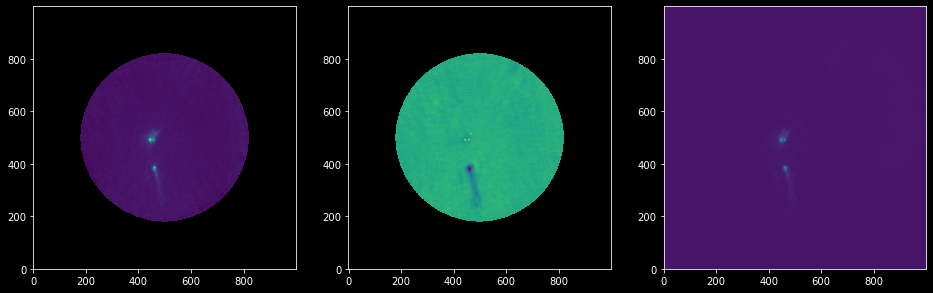

In [162]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_nopbcor"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    

pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

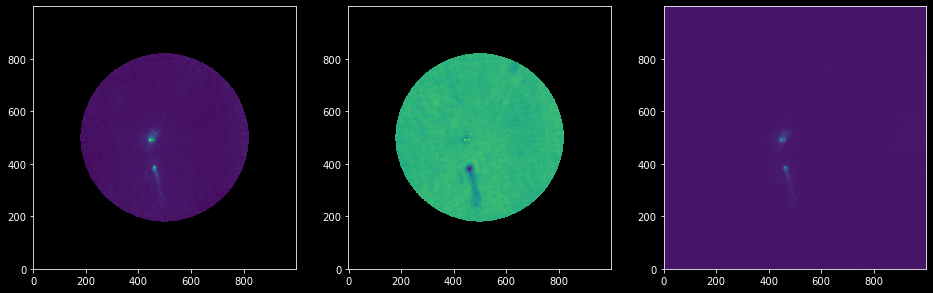

In [163]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_nopbdegrade"

img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    

pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

In [164]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_cleaned"

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1000, 1000],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       pblimit=0.05,
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       threshold='1mJy',
       niter=1000000,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

{}

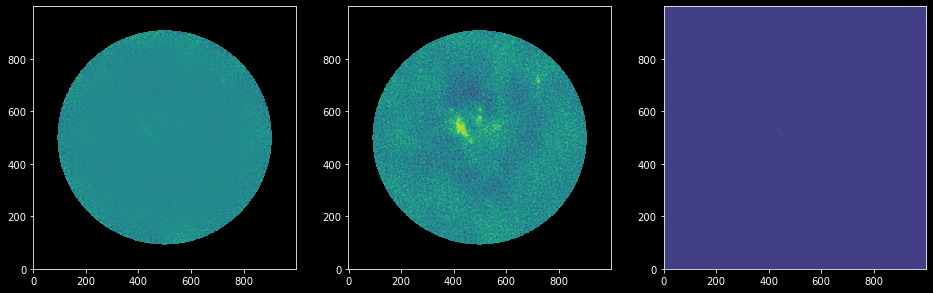

In [165]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_cleaned"


img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    

pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

In [ ]:
field = 26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_noselfcal_standardgridder_center_field{field}"

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="data",
       imagename=imagename_standard,
       imsize=[1200, 1200],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       pblimit=0.05,
       scales=[0, 3, 9],
       nterms=2,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)
os.system(f"rm -r {imagename_standard}.model.*")
os.system(f"rm -r {imagename_standard}.residual.*")
# immath(imagename='', mode='evalexpr', outfile='immath_results.im', expr='IM0', varnames='', sigma='0.0mJy/beam', polithresh='', mask='', region='', box='', chans='', stokes='', stretch=False, imagemd='', prec='float')
imregrid(imagename=finalmodelname[0]+".pbcor", template=imagename_standard+".image.tt0", output=imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor")
imregrid(imagename=finalmodelname[1]+".pbcor", template=imagename_standard+".image.tt1", output=imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor")
immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt0.pbcor", ],           
       expr="IM0 * IM1",
       outfile=imagename_standard+".model.tt0",
       imagemd=imagename_standard+".image.tt0")
immath(imagename=[imagename_standard+".pb.tt0", imagename_standard+"_finalmodel_proj_std.model.tt1.pbcor", ],
       expr="IM0 * IM1",
       outfile=imagename_standard+".model.tt1",
       imagemd=imagename_standard+".image.tt1")
for fn in [f"{imagename_standard}.image.tt{ii}" for ii in range(2)]:
    shutil.move(fn, fn.replace(".image", ".dirty.image"))

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1200, 1200],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="mtmfs",
       scales=[0, 3, 9],
       nterms=2,
       pblimit=0.05,
       smallscalebias=0.6,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       niter=0,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

In [ ]:
field = 26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_noselfcal_standardgridder_center_field{field}"


img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    
pl.figure()
pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

print(img[0][950:1050,200:300].min(),
      model[0][950:1050,200:300].max()*img.pixels_per_beam)

imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"
pl.figure()
img = SpectralCube.read(imagename_standard+".image.tt0.pbcor", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model.tt0", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual.tt0", format='casa_image')    
pl.figure()
pl.subplot(1,3,1).imshow(img[0].value)
pl.subplot(1,3,2).imshow(residual[0].value)
pl.subplot(1,3,3).imshow(model[0].value)

print(img[0][950:1050,200:300].min(),
      model[0][950:1050,200:300].max()*img.pixels_per_beam)

In [139]:
ls -d $imagename_standard*

imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha.error/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.alpha.pbcor/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.image.tt0/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.image.tt0.pbcor/
imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field26_nopbcor.ima

In [41]:
#rm -r imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field11_hogbomcleaned*

In [ ]:
field = 26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_hogbomcleaned"

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1200, 1200],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="hogbom",
       pblimit=0.05,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       threshold='1mJy',
       niter=1000000,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

In [ ]:
field = 26
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_hogbomcleaned"


img = SpectralCube.read(imagename_standard+".image", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual", format='casa_image')    
pb = SpectralCube.read(imagename_standard+".pb", format='casa_image')    


pl.figure(figsize=(12,4))

ax = pl.subplot(1,3,1)
im = ax.imshow(img[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
ax = pl.subplot(1,3,2)
im = ax.imshow(residual[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)

ax = pl.subplot(1,3,3)
im = ax.imshow(model[0].value, norm=simple_norm(model[0].value, max_percent=99.995, min_percent=1, stretch='log'))
#pl.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
pl.colorbar(mappable=im)

In [318]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_hogbomcleaned_onlylowfreq"

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="corrected",
       spw='210~225GHz',
       imagename=imagename_standard,
       imsize=[1200, 1200],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="standard",
       deconvolver="hogbom",
       pblimit=0.05,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       threshold='1mJy',
       niter=1000000,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

{}

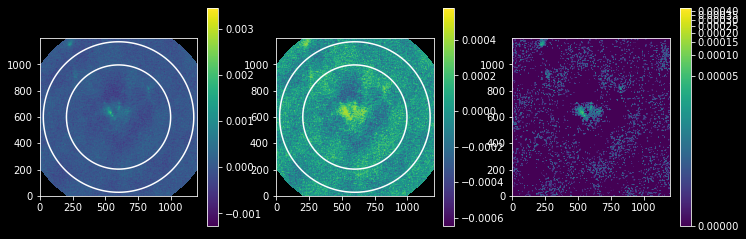

In [19]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_hogbomcleaned_onlylowfreq"


img = SpectralCube.read(imagename_standard+".image", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual", format='casa_image')    
pb = SpectralCube.read(imagename_standard+".pb", format='casa_image')    

pl.figure(figsize=(12,4))

ax = pl.subplot(1,3,1)
im = ax.imshow(img[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
ax = pl.subplot(1,3,2)
im = ax.imshow(residual[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)

ax = pl.subplot(1,3,3)
im = ax.imshow(model[0].value, norm=simple_norm(model[0].value, max_percent=99.995, min_percent=1, stretch='log'))
#pl.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
pl.colorbar(mappable=im)

In [22]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_mosaicgridder_center_field{field}_hogbomcleaned"

tclean(vis=msname,
       selectdata=True,
       field=str(field),
       antenna=antennae,
       datacolumn="corrected",
       imagename=imagename_standard,
       imsize=[1200, 1200],
       #phasecenter="ICRS 290.9332327deg 14.50817819deg",
       cell=['0.06arcsec', '0.06arcsec'],
       stokes="I",projection="SIN",
       nchan=-1,start="",width="",outframe="LSRK",veltype="radio",
       gridder="mosaic",
       deconvolver="hogbom",
       pblimit=0.05,
       restoration=True,
       pbcor=True,
       weighting="briggs",
       robust=0,
       threshold='1mJy',
       niter=1000000,
       restart=True,
       savemodel="none",
       calcres=True,
       calcpsf=True,
       parallel=False)

{}

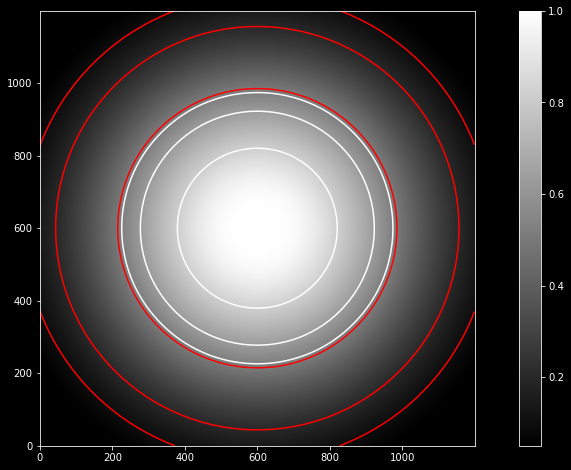

In [27]:
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}_hogbomcleaned"
standardpb = SpectralCube.read(imagename_standard+".pb", format='casa_image')    

imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_mosaicgridder_center_field{field}_hogbomcleaned"
mosaicpb = SpectralCube.read(imagename_standard+".pb", format='casa_image')

pl.imshow(standardpb[0].value, cmap='gray')
pl.colorbar()
pl.contour(standardpb[0].value, levels=[0.05, 0.1, 0.2, 0.5], colors=['r']*5)
pl.contour(mosaicpb[0].value, levels=[0.05, 0.1, 0.2, 0.5], colors=['w']*5)
pl.gca().set_aspect('equal')

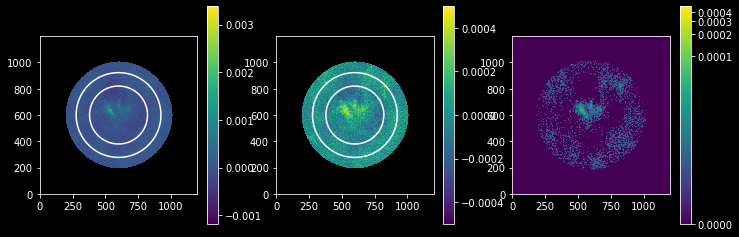

In [23]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_mosaicgridder_center_field{field}_hogbomcleaned"


img = SpectralCube.read(imagename_standard+".image", format='casa_image')    
model = SpectralCube.read(imagename_standard+".model", format='casa_image')    
residual = SpectralCube.read(imagename_standard+".residual", format='casa_image')    
pb = SpectralCube.read(imagename_standard+".pb", format='casa_image')    


pl.figure(figsize=(12,4))

ax = pl.subplot(1,3,1)
im = ax.imshow(img[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
ax = pl.subplot(1,3,2)
im = ax.imshow(residual[0].value)
pl.colorbar(mappable=im)
ax.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)

ax = pl.subplot(1,3,3)
im = ax.imshow(model[0].value, norm=simple_norm(model[0].value, max_percent=99.995, min_percent=1, stretch='log'))
#pl.contour(pb[0].value, levels=[0.2, 0.5], colors=['w']*2)
pl.colorbar(mappable=im)

In [ ]:
data = tb.getcol

should i be using 
https://github.com/radio-astro/casa/blob/master/gcwrap/python/scripts/recipes/makepb.py#L71-L76

In [51]:
# https://gitlab.nrao.edu/rurvashi/interactive-imaging-with-casa6/-/blob/master/Casa6_PySynthesisImager/Casa6_Interactive_Imager_PySynthesisImager.py
from casatasks.private.imagerhelpers.imager_base import PySynthesisImager
from casatasks.private.imagerhelpers.input_parameters import ImagerParameters

In [82]:
field = 11
imagename_standard = f"{stdgrdpath}/W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_standardgridder_center_field{field}"
paramList = ImagerParameters(
            msname = msname,
            field=f"{field}",
            imagename=imagename_standard,
            antenna=antennae,
            specmode='mfs',
            gridder='standard',
            imsize=[1200, 1200],
            cell=['0.06arcsec', '0.06arcsec'],
            niter=100,
            pblimit=0.05,
            weighting="briggs",
            robust=0,
            deconvolver='hogbom')
imager = PySynthesisImager(params=paramList)
## Initialize modules major cycle modules
imager.initializeImagers()
imager.initializeNormalizers()
imager.setWeighting()

## Init minor cycle modules
imager.initializeDeconvolvers()
imager.initializeIterationControl()

## (5) Make the initial images
imager.makePSF()
imager.makePB()

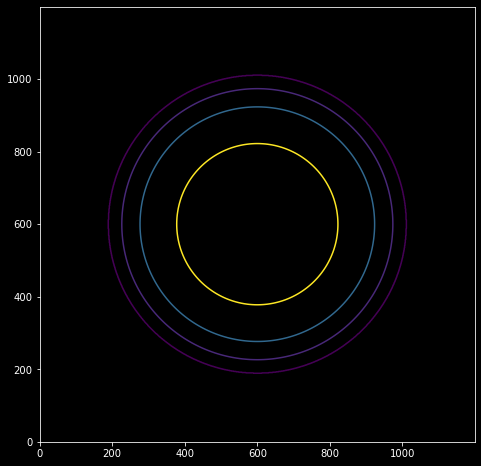

In [83]:
pb = SpectralCube.read(imagename_standard+".pb", format='casa_image')
pl.contour(pb[0].value, levels=[0.05,0.1,0.2,0.5])
pl.gca().set_aspect('equal')

In [56]:
show(imagename_standard)

FileNotFoundError: imaging_results/W51-E_StandardGridderTests//W51-E_B6_uid___A001_X1296_X215_continuum_merged_12M_robust0_finalselfcal_mosaicgridder_center_field11.image